# Data-Driven Crop Diagnostic Platform for Farmers

## Project Overview

Our project aims to develop a data-driven AI platform that leverages image classification technology to diagnose crop diseases and provide comprehensive insights and actionable recommendations to rural farmers. By integrating image data with environmental factors, we strive to enhance agricultural productivity and promote sustainable farming practices.

## Objectives

- **Identify Crop Diseases**: Use image classification to accurately identify various crop diseases.
- **Predictive Model Development**: Develop a model that combines image data with environmental factors to provide comprehensive insights into crop health.
- **Actionable Recommendations**: Provide farmers with practical advice on managing and preventing crop diseases based on the model's predictions.
- **Time Series Analysis**: Investigate the use of time series analysis to predict the spread of crop diseases based on environmental factors.

## Our Solution

AI-Driven Crop Diagnostic Platform: A user-friendly mobile application where farmers can upload images of their crops. Our AI algorithms will analyze the images to diagnose issues such as pests, diseases, and nutrient deficiencies. The platform will also incorporate environmental data to provide a holistic view of crop health.

## Key Features:

- **Instant Diagnostics**: Real-time analysis of crop images with high accuracy.
- **Predictive Insights**: Combining image data with environmental factors for comprehensive health insights.
- **Actionable Recommendations**: Tailored advice on how to address identified issues and prevent future occurrences.
- **Support Network**: Access to community forums, real-time chat support, and local field agents for additional assistance.

# Data Sources Details

### PlantVillage Dataset
- **Source**: Kaggle, PlantVillage
- **Columns**:

**`image_id`**: Unique identifier for each image

**`image_path`**: Path to the image file

**`crop_type`**: Type of crop (e.g., apple, grape, tomato)

**`disease_type`**: Type of disease (e.g., apple scab, grape black rot)

**`health_status`**: Health status of the plant (healthy or diseased)

**`image`**: The image data itself

### Mendeley Data Repository
- **Source**: Mendeley Data Repository
- **Columns**:
**`image_id`**: Unique identifier for each image

**`image_path`**: Path to the image file

**`crop_type`**: Type of crop

**`disease_type`**: Type of disease or pest

**`nutrient_deficiency`**: Type of nutrient deficiency (if applicable)\

**`location`**: Geographic location where the image was taken

**`image`**: The image data itself

### NASA Earth Observing System Data and Information System (EOSDIS)

- **Source**: NASA EOSDIS
- **Columns**:
**`date`**: Date of the observation

**`latitude`**: Latitude of the observation location

**`longitude`**: Longitude of the observation location

**`temperature`**: Surface temperature (in Celsius)

**`precipitation`**: Precipitation levels (in mm)

**`humidity`**: Relative humidity (in %)

**`solar_radiation`**: Solar radiation levels (in W/m²)

**`soil_moisture`**: Soil moisture levels (in m³/m³)

## 1. Data Loading and Understanding
Load the images from both folders using a data generator and displays the names of all the classes and also images from the various classes.

In [3]:
5 * 3

15

Found 55441 images belonging to 39 classes.
Found 61480 images belonging to 39 classes.
Classes: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Background_without_leaves', 'Blueberry___healthy', 'Cherry___Powdery_mildew', 'Cherry___healthy', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Corn___Common_rust', 'Corn___Northern_Leaf_Blight', 'Corn___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato__

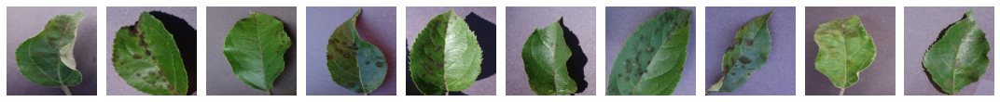

No images found for class: Background_without_leaves


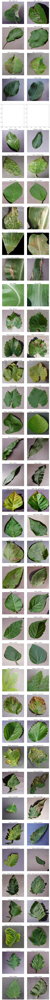

In [5]:
import os
import glob
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

class DataLoadingAndUnderstanding:
    def __init__(self, no_aug_dir, aug_dir, target_size=(224, 224), batch_size=32):
        """
        Initialize with directories containing the dataset, and set up data generators.

        :param no_aug_dir: Directory for dataset without augmentation.
        :param aug_dir: Directory for dataset with augmentation.
        :param target_size: Tuple specifying the target size of the images.
        :param batch_size: Batch size for data generators.
        """
        self.no_aug_dir = no_aug_dir
        self.aug_dir = aug_dir
        self.target_size = target_size
        self.batch_size = batch_size
        
        # Initialize data generators
        self.no_aug_datagen = ImageDataGenerator(rescale=1./255)
        self.aug_datagen = ImageDataGenerator(rescale=1./255)
        
        # Load data
        self.no_aug_generator = self._load_data(self.no_aug_datagen, self.no_aug_dir)
        self.aug_generator = self._load_data(self.aug_datagen, self.aug_dir)
        
        # Get classes
        self.classes = self.no_aug_generator.class_indices.keys()

    def _load_data(self, datagen, directory):
        """
        Private method to load data from a directory using a given ImageDataGenerator.

        :param datagen: Instance of ImageDataGenerator.
        :param directory: Directory from which to load images.
        :return: A generator that yields batches of images from the specified directory.
        """
        return datagen.flow_from_directory(
            directory,
            target_size=self.target_size,
            batch_size=self.batch_size,
            class_mode='categorical'
        )
    
    def show_classes(self):
        """Display the list of classes (disease categories)."""
        print(f"Classes: {list(self.classes)}")
    
    def visualize_images_from_folder(self, folder_path, num_images=10):
        """
        Display a few images from a specified folder.

        :param folder_path: Path to the folder containing images.
        :param num_images: Number of images to display.
        """
        # Ensure the folder exists
        if not os.path.exists(folder_path):
            print(f"Folder does not exist: {folder_path}")
            return
        
        # List all image files in the folder
        image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        # Check if there are images available
        if len(image_files) == 0:
            print(f"No images found in {folder_path}")
            return
        
        # Limit to the specified number of images
        image_files = image_files[:num_images]
        
        plt.figure(figsize=(15, 15))
        
        for i, image_file in enumerate(image_files):
            image_path = os.path.join(folder_path, image_file)
            try:
                img = Image.open(image_path)
                plt.subplot(1, num_images, i + 1)
                plt.imshow(img)
                plt.axis('off')
            except Exception as e:
                print(f"Could not open image {image_path}: {e}")
        
        plt.tight_layout()
        plt.show()
    
    def display_sample_images(self, samples_per_class=1, image_size=(224, 224)):
        """
        Display sample images from each class to get an understanding of the data.

        :param samples_per_class: Number of images to display per class.
        :param image_size: Size to resize the images for display (width, height).
        """
        num_classes = len(self.classes)
        fig, axes = plt.subplots(nrows=num_classes, ncols=samples_per_class, figsize=(5 * samples_per_class, 5 * num_classes))

        # Loop through each class and display sample images
        for i, cls in enumerate(self.classes):
            image_paths = glob.glob(os.path.join(self.no_aug_dir, cls, "*.JPG"))
            if len(image_paths) == 0:
                # If there are no images for this class, skip it and continue
                print(f"No images found for class: {cls}")
                continue

            for j in range(min(samples_per_class, len(image_paths))):  # Display only available images
                image_path = image_paths[j]  # Get the j-th image for the i-th class
                image = Image.open(image_path).resize(image_size)  # Resize image
                axes[i, j].imshow(image)
                axes[i, j].set_title(cls, fontsize=12)  # Set the title as the class name
                axes[i, j].axis('off')  # Hide axis

            # Hide unused subplots
            for k in range(len(image_paths), samples_per_class):
                axes[i, k].axis('off')

        plt.tight_layout()
        plt.show()

# Example usage:
data_loader = DataLoadingAndUnderstanding(
    no_aug_dir='Plant_leave_diseases_dataset_without_augmentation',
    aug_dir='Plant_leave_diseases_dataset_with_augmentation'
)
data_loader.show_classes()
data_loader.visualize_images_from_folder('Plant_leave_diseases_dataset_without_augmentation/Apple___Apple_scab')
data_loader.display_sample_images(samples_per_class=2)


## 2. Data Cleaning

### ***2.1 Remove Corrupt Images***
Check for and remove any corrupt or unreadable images.

In [6]:
import os
from PIL import Image

def check_corrupt_images(directory):
    corrupt_images = []
    
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                file_path = os.path.join(root, file)
                try:
                    # Attempt to open the image and verify it
                    with Image.open(file_path) as img:
                        img.verify()  # Verify that it is not corrupt
                except (IOError, SyntaxError, OSError) as e:
                    print(f'Corrupt image detected and removed: {file_path}')
                    os.remove(file_path)  # Remove the corrupt image
                    corrupt_images.append(file_path)
    
    if not corrupt_images:
        return "No corrupt images found."
    else:
        return f"Total corrupt images found and removed: {len(corrupt_images)}"


In [7]:
# Specify the directories to the datasets
no_aug_dir='Plant_leave_diseases_dataset_without_augmentation'
aug_dir='Plant_leave_diseases_dataset_with_augmentation'

In [8]:
# Call the function to check  for corrupt images in the dataset without_augmentation
result = check_corrupt_images(no_aug_dir)
print(result)

No corrupt images found.


In [9]:
# Call the function to check  for corrupt images in the dataset with_augmentation
result = check_corrupt_images(aug_dir)
print(result)

No corrupt images found.


***There are no corrupt images in our dataset***

### ***2.2 Remove Duplicates***
Detect and remove any duplicate images.

In [10]:
import os
import hashlib

def find_duplicate_images(directory):
    """
    Find and remove duplicate images in a directory.

    :param directory: Directory where the images are stored.
    """
    hash_set = set()
    duplicates = []

    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                file_path = os.path.join(root, file)
                try:
                    # Compute the hash of the image file
                    with open(file_path, 'rb') as f:
                        file_hash = hashlib.md5(f.read()).hexdigest()

                    if file_hash in hash_set:
                        duplicates.append(file_path)
                    else:
                        hash_set.add(file_hash)
                
                except Exception as e:
                    print(f"Error processing file {file_path}: {e}")

    if duplicates:
        print(f"Duplicate images found: {len(duplicates)}")
        for file_path in duplicates:
            print(file_path)
        # Uncomment the following line if you want to remove duplicates
        # for file_path in duplicates:
        #     os.remove(file_path)
    else:
        print("No duplicate images found.")


***2.2.0 Run the function on the directories***

In [11]:
find_duplicate_images(no_aug_dir)

Duplicate images found: 17
Plant_leave_diseases_dataset_without_augmentation/Tomato___Late_blight/image (1704).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___Late_blight/image (1748).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___Late_blight/image (109).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___Late_blight/image (1627).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___healthy/image (984).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___healthy/image (553).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___healthy/image (1457).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___healthy/image (1027).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___healthy/image (1305).JPG
Plant_leave_diseases_dataset_without_augmentation/Tomato___healthy/image (943).JPG
Plant_leave_diseases_dataset_without_augmentation/Apple___healthy/image (904).JPG
Plant_leave_diseases_dataset_without_au

In [12]:
find_duplicate_images(aug_dir)

Duplicate images found: 206
Plant_leave_diseases_dataset_with_augmentation/Tomato___Late_blight/image (1704).JPG
Plant_leave_diseases_dataset_with_augmentation/Tomato___Late_blight/image (1748).JPG
Plant_leave_diseases_dataset_with_augmentation/Tomato___Late_blight/image (109).JPG
Plant_leave_diseases_dataset_with_augmentation/Tomato___Late_blight/image (1627).JPG
Plant_leave_diseases_dataset_with_augmentation/Apple___Cedar_apple_rust/image (516).JPG
Plant_leave_diseases_dataset_with_augmentation/Apple___Cedar_apple_rust/image (645).JPG
Plant_leave_diseases_dataset_with_augmentation/Apple___Cedar_apple_rust/image (491).JPG
Plant_leave_diseases_dataset_with_augmentation/Apple___Cedar_apple_rust/image (868).JPG
Plant_leave_diseases_dataset_with_augmentation/Apple___Cedar_apple_rust/image (468).JPG
Plant_leave_diseases_dataset_with_augmentation/Apple___Cedar_apple_rust/image (829).JPG
Plant_leave_diseases_dataset_with_augmentation/Apple___Cedar_apple_rust/image (628).JPG
Plant_leave_disea

#### **There are no duplicates**

***3.4.0 Run the function on the directories***

In [13]:
enhance_images(no_aug_dir)

NameError: name 'enhance_images' is not defined

In [13]:
enhance_images(aug_dir)

## 3. Exploratory Data Analysis (EDA)

### ***3.1 Univariate Analysis***
Check the distribution of images across different classes.

In [14]:
import matplotlib.pyplot as plt
import os

def plot_class_distribution(directory):
    class_counts = {}
    
    # Count the number of images per class
    for root, dirs, files in os.walk(directory):
        if len(files) > 0:
            class_name = os.path.basename(root)
            class_counts[class_name] = len(files)
    
    # Plotting for all classes
    plt.figure(figsize=(12, 8))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution (All Classes)')
    
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    # Plotting for the top 5 classes
    top_5_classes = dict(sorted(class_counts.items(), key=lambda item: item[1], reverse=True)[:5])
    
    plt.figure(figsize=(8, 6))
    plt.bar(top_5_classes.keys(), top_5_classes.values(), color='orange')
    
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Top 5 Classes with Most Images')
    
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Plotting for the bottom 5 classes
    bottom_5_classes = dict(sorted(class_counts.items(), key=lambda item: item[1])[:5])
    
    plt.figure(figsize=(8, 6))
    plt.bar(bottom_5_classes.keys(), bottom_5_classes.values(), color='green')
    
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Bottom 5 Classes with Fewest Images')
    
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


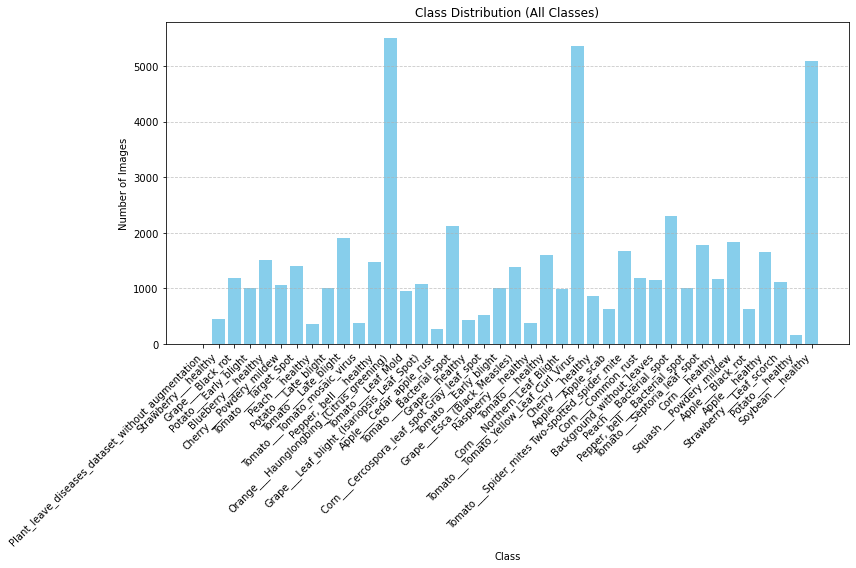

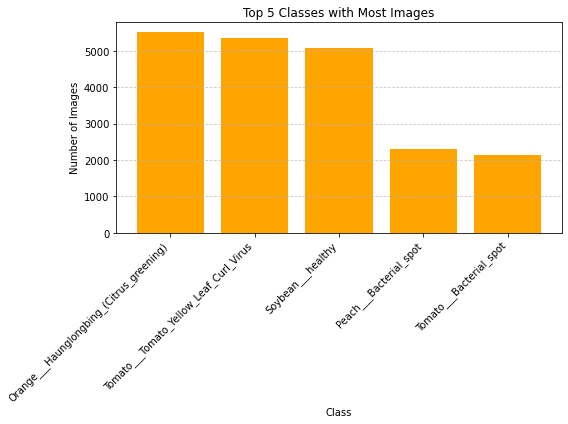

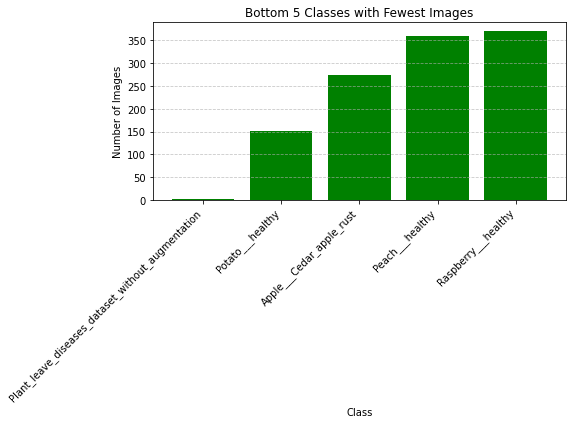

In [16]:
plot_class_distribution(no_aug_dir)

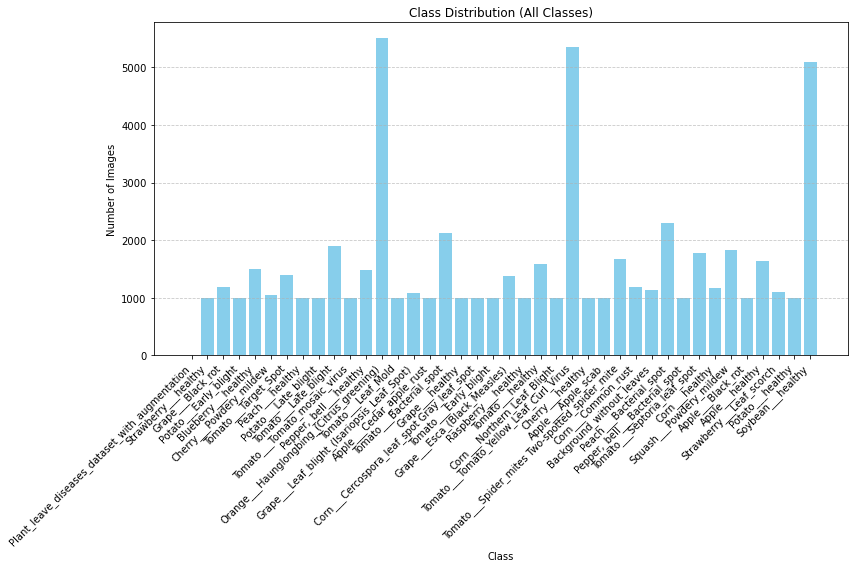

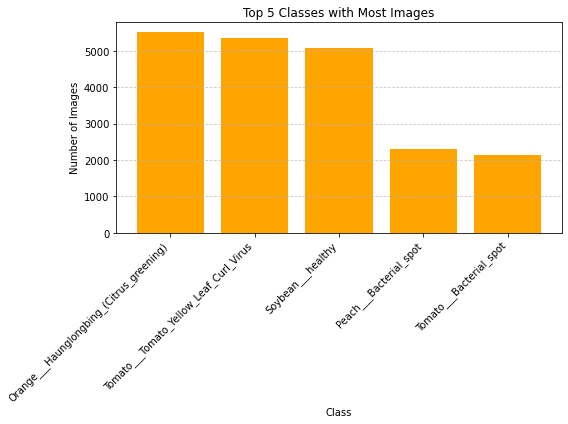

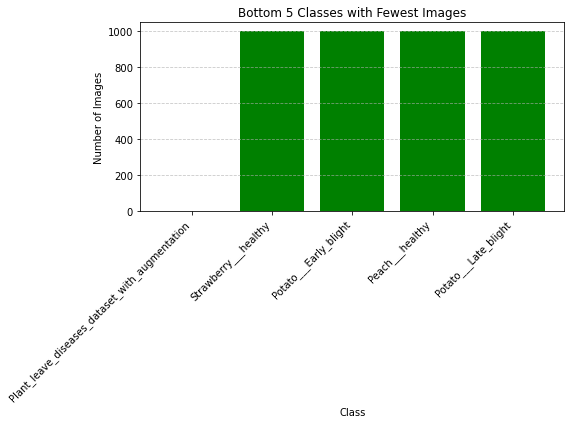

In [17]:
plot_class_distribution(aug_dir)

# 4. Data Preparation

In [18]:
##### Work in progress

In [19]:
import os
import shutil
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

class DataPreparation:
    def __init__(self, data_dir, target_size=(224, 224), batch_size=32, test_split=0.1, validation_split=0.2):
        """
        Initialize with dataset directory and parameters for image processing.
        
        :param data_dir: Directory where the dataset is stored.
        :param target_size: Target size for resizing images.
        :param batch_size: Batch size for training and validation.
        :param test_split: Proportion of data to reserve for testing.
        :param validation_split: Proportion of data to reserve for validation.
        """
        self.data_dir = data_dir
        self.target_size = target_size
        self.batch_size = batch_size
        self.test_split = test_split
        self.validation_split = validation_split
        self.label_encoder = LabelEncoder()  # Initialize label encoder

    def encode_labels(self, classes):
        """
        Encode the class labels into numerical format.
        
        :param classes: List of class names.
        :return: Dictionary mapping class names to numerical labels.
        """
        labels = self.label_encoder.fit_transform(classes)
        label_mapping = dict(zip(self.label_encoder.classes_, labels))
        print(f"Label Mapping: {label_mapping}")
        return label_mapping
    
    def split_data(self):
        """
        Split the dataset into training, validation, and test sets.
        """
        # Ensure base directories exist
        if not os.path.exists(self.data_dir):
            raise FileNotFoundError(f"Data directory {self.data_dir} not found")

        split_dirs = ['train', 'validation', 'test']
        for split_dir in split_dirs:
            split_path = os.path.join(self.data_dir, split_dir)
            if not os.path.exists(split_path):
                os.makedirs(split_path, exist_ok=True)
            for cls in os.listdir(self.data_dir):
                cls_path = os.path.join(self.data_dir, cls)
                if os.path.isdir(cls_path):
                    os.makedirs(os.path.join(split_path, cls), exist_ok=True)

        all_images = []
        all_labels = []
        for cls in os.listdir(self.data_dir):
            cls_path = os.path.join(self.data_dir, cls)
            if os.path.isdir(cls_path):
                for file in os.listdir(cls_path):
                    if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                        all_images.append(os.path.join(cls_path, file))
                        all_labels.append(cls)

        # Encode labels
        label_mapping = self.encode_labels(np.unique(all_labels))

        # Split the data
        X_train, X_temp, y_train, y_temp = train_test_split(all_images, all_labels, test_size=self.test_split, stratify=all_labels)
        X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=self.test_split / (1 - self.test_split), stratify=y_temp)

        # Copy files to respective directories
        for image, label in zip(X_train, y_train):
            shutil.copy2(image, os.path.join(self.data_dir, 'train', label, os.path.basename(image)))
        for image, label in zip(X_val, y_val):
            shutil.copy2(image, os.path.join(self.data_dir, 'validation', label, os.path.basename(image)))
        for image, label in zip(X_test, y_test):
            shutil.copy2(image, os.path.join(self.data_dir, 'test', label, os.path.basename(image)))

    def load_data(self):
        """
        Load the data using ImageDataGenerator and create training, validation, and test sets.
        
        :return: Training, validation, and test data generators.
        """
        datagen = ImageDataGenerator(rescale=1./255, validation_split=self.validation_split)  # Rescale images and split into training/validation sets
        
        # Create training data generator
        train_generator = datagen.flow_from_directory(
            os.path.join(self.data_dir, 'train'),
            target_size=self.target_size,
            batch_size=self.batch_size,
            class_mode='categorical',
            shuffle=True  # Shuffle training data
        )
        
        # Create validation data generator
        validation_generator = datagen.flow_from_directory(
            os.path.join(self.data_dir, 'validation'),
            target_size=self.target_size,
            batch_size=self.batch_size,
            class_mode='categorical'
        )
        
        # Create test data generator
        test_datagen = ImageDataGenerator(rescale=1./255)  # Only rescale for test data
        test_generator = test_datagen.flow_from_directory(
            os.path.join(self.data_dir, 'test'),
            target_size=self.target_size,
            batch_size=self.batch_size,
            class_mode='categorical'
        )
        
        return train_generator, validation_generator, test_generator


In [21]:
# Initialize data preparation
data_dir = 'Plant_leave_diseases_dataset_without_augmentation'  # Update with the actual path
data_preparation = DataPreparation(data_dir)
data_preparation.split_data()  # Split the data into train, validation, and test
train_gen, val_gen, test_gen = data_preparation.load_data()  # Load training, validation, and test data

# Print dataset sizes
print(f"Training data: {train_gen.samples} samples")
print(f"Validation data: {val_gen.samples} samples")
print(f"Test data: {test_gen.samples} samples")

Label Mapping: {'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Background_without_leaves': 4, 'Blueberry___healthy': 5, 'Cherry___Powdery_mildew': 6, 'Cherry___healthy': 7, 'Corn___Cercospora_leaf_spot Gray_leaf_spot': 8, 'Corn___Common_rust': 9, 'Corn___Northern_Leaf_Blight': 10, 'Corn___healthy': 11, 'Grape___Black_rot': 12, 'Grape___Esca_(Black_Measles)': 13, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 14, 'Grape___healthy': 15, 'Orange___Haunglongbing_(Citrus_greening)': 16, 'Peach___Bacterial_spot': 17, 'Peach___healthy': 18, 'Pepper,_bell___Bacterial_spot': 19, 'Pepper,_bell___healthy': 20, 'Potato___Early_blight': 21, 'Potato___Late_blight': 22, 'Potato___healthy': 23, 'Raspberry___healthy': 24, 'Soybean___healthy': 25, 'Squash___Powdery_mildew': 26, 'Strawberry___Leaf_scorch': 27, 'Strawberry___healthy': 28, 'Tomato___Bacterial_spot': 29, 'Tomato___Early_blight': 30, 'Tomato___Late_blight': 31, 'Tomato___Leaf_Mold': 32, 

In [22]:
import os

def get_classes_from_directory(directory):
    """
    Get a list of class names from the directory structure.
    
    :param directory: Directory containing the class subdirectories.
    :return: Set of class names.
    """
    return set(os.listdir(directory))

def check_classes(train_dir, val_dir, test_dir):
    """
    Check if the classes are the same across training, validation, and test datasets.
    
    :param train_dir: Directory containing training data.
    :param val_dir: Directory containing validation data.
    :param test_dir: Directory containing test data.
    """
    # Get classes from each directory
    train_classes = get_classes_from_directory(train_dir)
    val_classes = get_classes_from_directory(val_dir)
    test_classes = get_classes_from_directory(test_dir)
    
    # Print class names
    print(f"Classes in training data: {train_classes}")
    print(f"Classes in validation data: {val_classes}")
    print(f"Classes in test data: {test_classes}")
    
    # Check if all class sets are the same
    if train_classes == val_classes == test_classes:
        print("All datasets have the same classes.")
    else:
        print("Classes are not consistent across datasets.")
        
        # Find the missing classes
        all_classes = train_classes.union(val_classes).union(test_classes)
        print("All classes found:", all_classes)
        print("Classes missing in some datasets:")
        print("In training but not in validation or test:", all_classes - train_classes)
        print("In validation but not in training or test:", all_classes - val_classes)
        print("In test but not in training or validation:", all_classes - test_classes)

# Set your directories
train_dir = 'Plant_leave_diseases_dataset_without_augmentation/train'
val_dir = 'Plant_leave_diseases_dataset_without_augmentation/validation'
test_dir = 'Plant_leave_diseases_dataset_without_augmentation/test'

# Check classes
check_classes(train_dir, val_dir, test_dir)


Classes in training data: {'Apple___Apple_scab', 'Strawberry___Leaf_scorch', 'Tomato___Leaf_Mold', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Corn___Northern_Leaf_Blight', 'Potato___Early_blight', 'Peach___Bacterial_spot', 'Strawberry___healthy', 'Tomato___Early_blight', 'Cherry___healthy', 'Tomato___Bacterial_spot', 'Grape___healthy', 'Tomato___Tomato_mosaic_virus', 'Blueberry___healthy', 'Pepper,_bell___Bacterial_spot', 'Apple___Black_rot', 'Corn___healthy', 'Tomato___Late_blight', 'Apple___Cedar_apple_rust', 'train', 'Raspberry___healthy', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Squash___Powdery_mildew', 'Cherry___Powdery_mildew', 'Apple___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Corn___Common_rust', 'Grape___Black_rot', 'Tomato___healthy', 'Soybean___healthy', 'Potato___healthy', 'Peach___healthy', 'Tomato___Septoria_leaf_spot', 'Potato___Late_blight', 'Background_without_leaves', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Tomato_Yellow_Leaf

# 5. Modelling

## ***5.1 Building the model***

### ***5.1.0 Baseline Model***

In [25]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

class BaseModel:
    def __init__(self, input_shape, num_classes):
        """
        Initialize the base model with default parameters.
        
        :param input_shape: Shape of the input images.
        :param num_classes: Number of output classes.
        """
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.model = self.build_model()  # Build the model with default parameters

    def build_model(self, conv_layers=None, dense_layers=None, dropout_rate=0.5, optimizer='adam'):
        """
        Build the CNN model architecture.
        
        :param conv_layers: List of tuples, where each tuple represents (filters, kernel_size) for a Conv2D layer.
                            Default is [(32, (3, 3)), (64, (3, 3)), (128, (3, 3))].
        :param dense_layers: List of integers where each represents the number of units in a Dense layer.
                             Default is [512, 256].
        :param dropout_rate: Dropout rate for the Dropout layers. Default is 0.5.
        :param optimizer: Optimizer to compile the model. Default is 'adam'.
        
        :return: Compiled model.
        """
        # Default parameters if none provided
        if conv_layers is None:
            conv_layers = [(32, (3, 3)), (64, (3, 3)), (128, (3, 3))]
        if dense_layers is None:
            dense_layers = [512, 256]
        
        model = Sequential()

        # Add convolutional layers
        for i, (filters, kernel_size) in enumerate(conv_layers):
            if i == 0:
                model.add(Conv2D(filters, kernel_size, activation='relu', input_shape=self.input_shape))
            else:
                model.add(Conv2D(filters, kernel_size, activation='relu'))
            model.add(BatchNormalization())
            model.add(MaxPooling2D((2, 2)))

        # Flatten the output
        model.add(Flatten())

        # Add dense layers
        for units in dense_layers:
            model.add(Dense(units, activation='relu'))
            model.add(Dropout(dropout_rate))
            model.add(Dense(41, activation='softmax'))


        # Output layer
        model.add(Dense(self.num_classes, activation='softmax'))

        # Compile the model
        model.compile(optimizer=optimizer, 
                      loss='categorical_crossentropy', 
                      metrics=['accuracy'])
        
        return model

    def summary(self):
        """Print the summary of the model."""
        self.model.summary()

    def train(self, train_generator, validation_generator, epochs=10):
        """
        Train the model using the provided training and validation data generators.
        
        :param train_generator: Training data generator.
        :param validation_generator: Validation data generator.
        :param epochs: Number of epochs to train the model. Default is 10.
        
        :return: Training history object.
        """
        history = self.model.fit(
            train_generator,
            epochs=epochs,
            validation_data=validation_generator
        )
        return history

    def evaluate(self, test_generator):
        """
        Evaluate the model on the test data.
        
        :param test_generator: Test data generator.
        :return: Test loss and accuracy.
        """
        test_loss, test_accuracy = self.model.evaluate(test_generator)
        print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
        return test_loss, test_accuracy


In [ ]:
# Initialize the base model
input_shape = train_gen.image_shape
num_classes = train_gen.num_classes
base_model = BaseModel(input_shape, num_classes)

# Print the model summary
base_model.summary()

# Train the model
history = base_model.train(train_gen, val_gen, epochs=10)

# Evaluate the model on the test set
test_loss, test_accuracy = base_model.evaluate(test_gen)


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
batch_normalization_3 (Batch (None, 222, 222, 32)      128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
batch_normalization_4 (Batch (None, 109, 109, 64)      256       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 52, 52, 128)      